# Lista 2 de Visão Computacional 2
**Tasso Luís Oliveira de Moraes** - tlom

YOLO que significa "You Only Look Once" é um dos mais famosos algoritmos de detecção de objetos devido a sua velocidade e precisão. Ele divide as imagens em um sistema de grades em que cada célula da grade é responsável por detectar o objeto.

Para esta atividade foi utilizado o tutorial [YOLOv5-Custom-Training](https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb?hl=pt_BR#scrollTo=hrsaDfdVHzxt) para utilizar a rede do YOLOv5 na detecção de mascaras.

1. O primeiro paço é transformar o data para o formato que suportado pelo YOLOv5 e para isso utilizamos o RoboFlow. Ao converter o dataset anotado em XML para o tipo suportado pelo YOLO o roboflow descartou algumas imagens e anotações alegando uma largura ou altura negativa do boundbox. Devido a isso foi gerado um dataset com 678 imagens para o treino 85 para validação (10%) e 85 para teste (10%). 
2. Também no Roboflow foi aplicado, nesse conjunto de 678 imagens, um *resize* para 416x416 e as seguintes técnicas de *Data Augmentation*:
> * Crop
> * Rotation
> * Shear
> * Brightness
> * Exposure
> * Blur

    Gerando assim um conjunto de treino de 2204 imagens.
3. Após gerar o dataset, é possível importar-lo do RoboFlow e utilizar para treinar o modelo.




## Paço 1: Instalação

In [1]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 8.1 MB/s 
     |████████████████████████████████| 178 kB 60.5 MB/s 
     |████████████████████████████████| 1.1 MB 58.8 MB/s 
     |████████████████████████████████| 67 kB 7.2 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
     |████████████████████████████████| 138 kB 73.4 MB/s 
     |████████████████████████████████| 596 kB 39.7 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.4-py3-none-any.whl size=21356 sha256=8955ad0c9ecc9ef0c81b0a5d394c0e561725ec5c69dc4322ab8fdc641b915abf
  Stored in directory: /root/.cache/pip/wheels/b7/2c/60/3733c0e323b1d7aec00f852264314bf6c48192c8e1dc92b3ee
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=ae506abcbe85b7e11223b81ecbf8f053485bdb908438d18eb5455311c3669fa4
  Stored in directory: /root/.cache/pip/

In [2]:
#clonando YOLOv5 e instalando dependências 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 12169, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 12169 (delta 0), reused 2 (delta 0), pack-reused 12167
Receiving objects: 100% (12169/12169), 11.93 MiB | 16.81 MiB/s, done.
Resolving deltas: 100% (8427/8427), done.
/content/yolov5


In [3]:
# importando as bibliotecas
import torch
import os
import random
from IPython.display import Image, clear_output, display  # to display images
import glob

In [4]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


# Paço 2: Montando Dataset

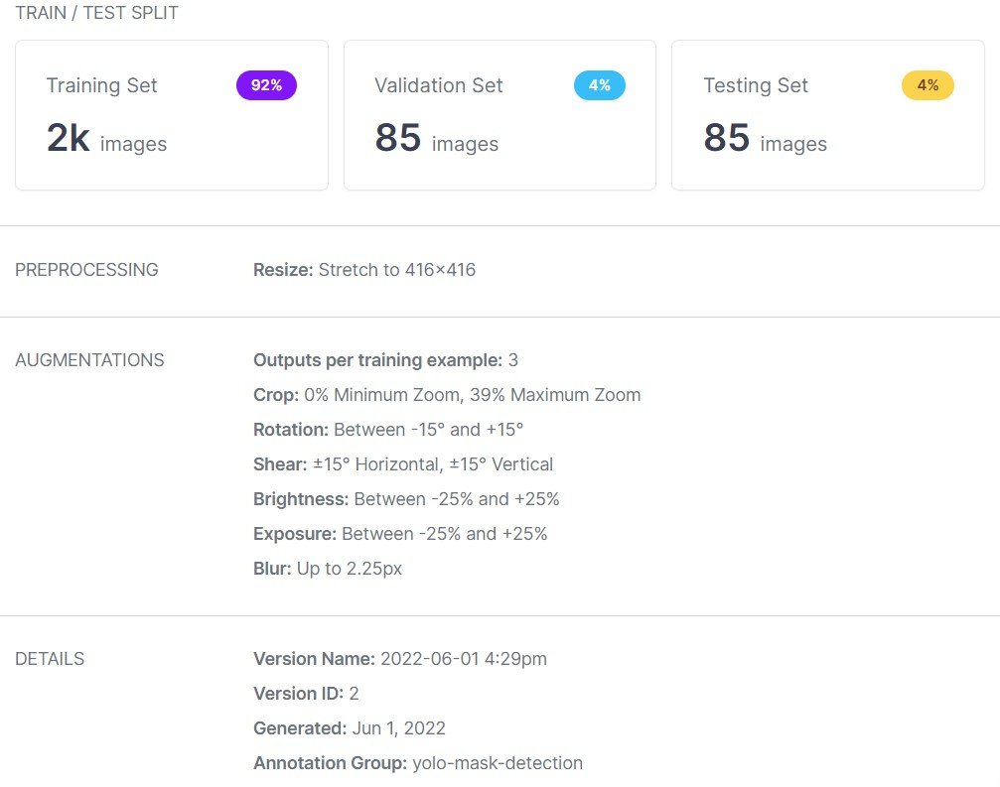

In [5]:
from roboflow import Roboflow

# importando o dataset da api do roboflow
rf = Roboflow(api_key="yYbrGFYjcdLd0Lt2bkw9")
project = rf.workspace("deep-learning-hwsxj").project("yolo-mask-detection-mr7ta")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to YOLO-Mask-Detection-2 in yolov5pytorch:: 100%|██████████| 4420/4420 [00:03<00:00, 1246.03it/s]


In [6]:
# configurando o ambiente
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

# Paço 3: Treinando o Modelo

Os seguintes parêmetros dizem respeito a:
- **img:** tamanho da imagem (416x416)
- **batch:** tamanho do *batchs* (16)
- **epochs:** define a quantidade de épocas para o treinamento (50)
- **data:** caminho no qual está localizado o dataset
- **weights:** especifica o caminho para os pesos de inicialização do *transfer learning*. Usamos o COCO genérico pré-treinado.
- **cache:** faz um *cache* das imagens para almentar a velocidade de trainamento.

In [7]:
!python train.py --img 416 --batch 16 --epochs 50 --data "/content/yolov5/YOLO-Mask-Detection-2/data.yaml" --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/YOLO-Mask-Detection-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-243-g7cef03d Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.

# Avaliando a Peformace do YOLOv5 no TensorBoard


In [41]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Rodando o Modelo no Conjunto de Test

In [9]:
!python detect.py --weights "runs/train/exp/weights/best.pt" --img 416 --conf 0.1 --source "/content/yolov5/YOLO-Mask-Detection-2/test/images"

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/YOLO-Mask-Detection-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-243-g7cef03d Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/85 /content/yolov5/YOLO-Mask-Detection-2/test/images/maksssksksss707_png.rf.132dae8a8d8ad8936bfab015a13b8ae4.jpg: 416x416 1 with_mask, Done. (0.010s)
image 2/85 /content/yolov5/YOLO-Mask-Detection-2/test/images/maksssksksss709_png.rf.3ef42c256aa1c6fd015fe735d7e4c366.jpg: 416x416 1 with_mask, Done. (0.010s)
image 3/85 /con

# Visualizando Detecção no Conjunto de Teste

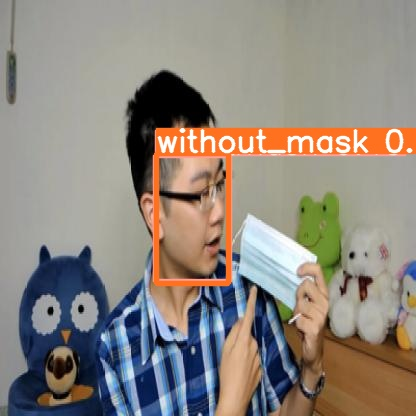

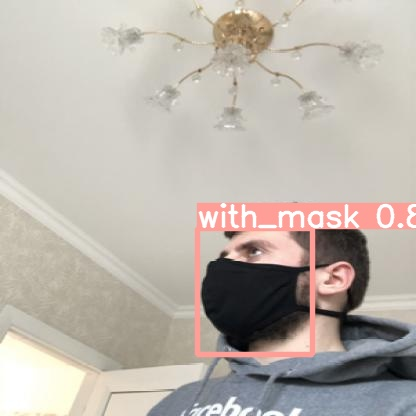

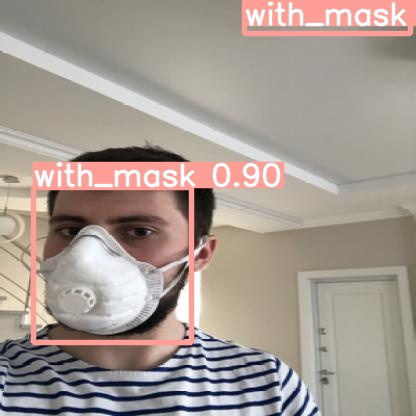

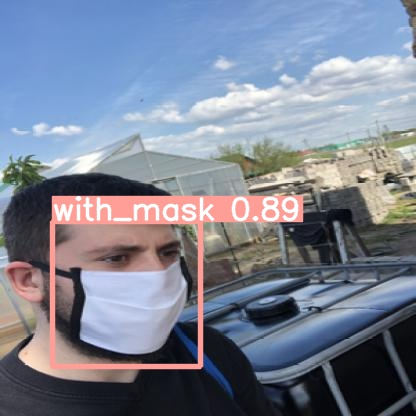

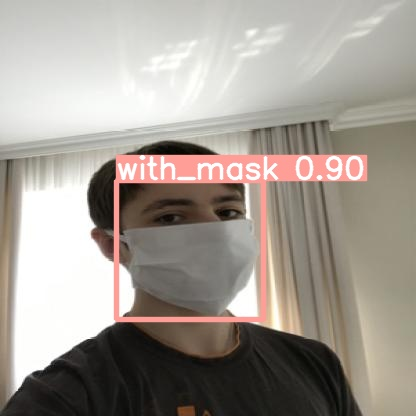

...

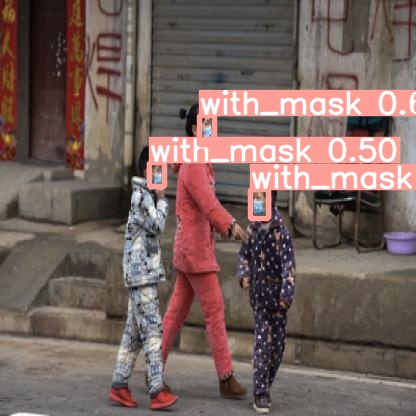

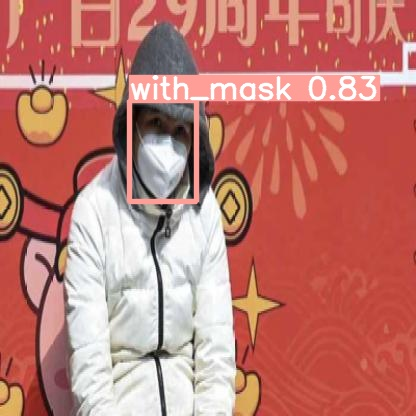

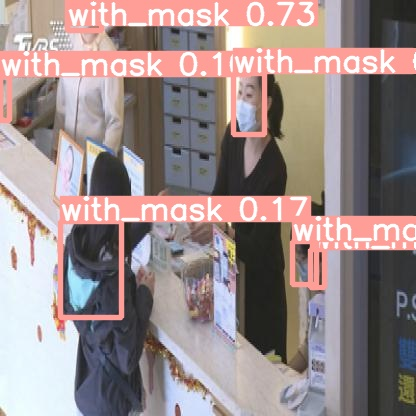

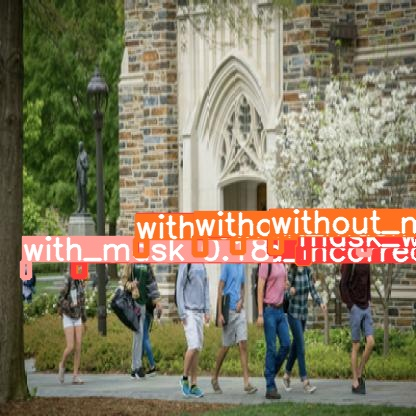

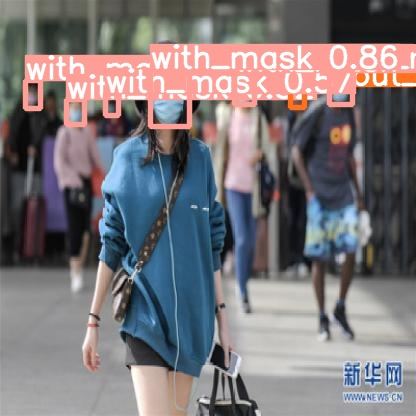

In [15]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Testando o Modelo no Video 1

In [12]:
!python detect.py --weights "runs/train/exp/weights/best.pt" --img 416 --conf 0.1 --source "/content/video1.mp4"

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/video1.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-243-g7cef03d Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/371) /content/video1.mp4: 256x416 3 with_masks, Done. (0.021s)
video 1/1 (2/371) /content/video1.mp4: 256x416 3 with_masks, Done. (0.018s)
video 1/1 (3/371) /content/video1.mp4: 256x416 3 with_masks, Done. (0.017s)
video 1/1 (4/371) /content/video1.mp4: 256x416 3 with_masks, Done. (0.016s)
video 1/1 (5/371) /content/video1.mp4: 256x416 3 with_mas

# Testando Modelo no Vídeo 2

In [16]:
!python detect.py --weights "runs/train/exp/weights/best.pt" --img 416 --conf 0.1 --source "/content/video2.mp4"

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/video2.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-243-g7cef03d Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/376) /content/video2.mp4: 256x416 7 with_masks, 2 without_masks, Done. (0.031s)
video 1/1 (2/376) /content/video2.mp4: 256x416 6 with_masks, 1 without_mask, Done. (0.015s)
video 1/1 (3/376) /content/video2.mp4: 256x416 6 with_masks, 1 without_mask, Done. (0.015s)
video 1/1 (4/376) /content/video2.mp4: 256x416 7 with_masks, 1 without_mask, Done. (

# Conclusões

O Modelo treinado no geral apresentou uma boa detecção. Porém, detecta, em alguns frames do vídeo, áreas que não são faces. O que poderia vir a melhora o modelo seria mudar as tecnicas utilizadas no *data augmentation*. 

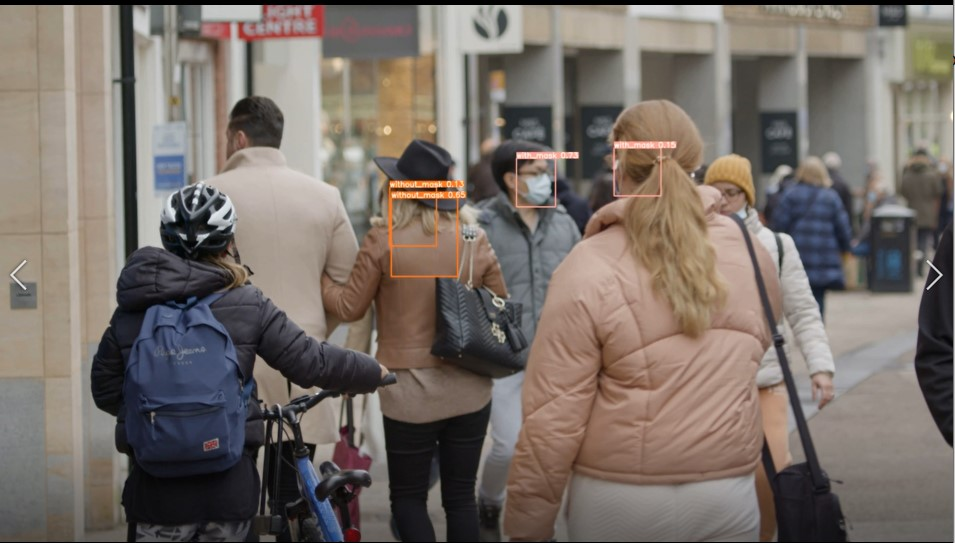

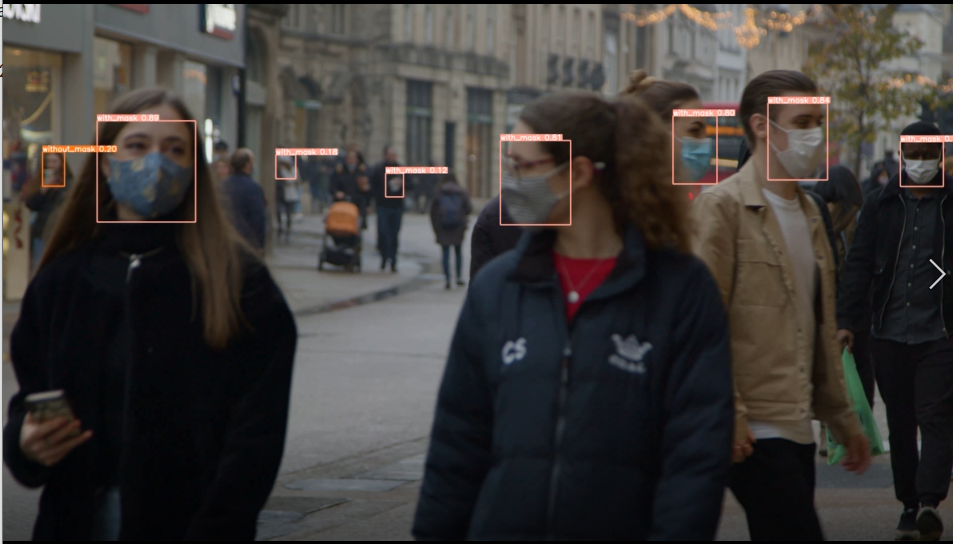